In [1]:
%%html
<style>

.header {
    padding: 20px;
    text-align: center;
    background: #d564d9;
    color: white;
    font-size: 30px;
    font-weight: bold;
}

.smallheader {
    color: #d564d9;
    font-size: 25px;
}

</style>

<div class="header" id="Inhoud">Inhoud<a class="anchor-link" href="#Inhoud"></a></div>

1. [Context](#Context)
1. [Libraries](#Libraries)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)
1. [Imports](#Imports)

<div class="header" id="Context">Context<a class="anchor-link" href="#Context"></a></div>

<div class='smallheader'>Waarom deze opdracht?<div>

!pip install typing-extensions

<div class="header" id="Libraries">Libraries<a class="anchor-link" href="#Libraries"></a></div>

<div class='smallheader'>Installatie van libraries<div>

!pip install opencv-python
!pip install dask
!pip install imageio
!pip install torch

!pip install torchvision
!pip install termcolor
!pip install matplotlib
!pip install pandas
!pip install plotly
!pip install seaborn
!pip install ipywidgets

%%capture
!pip install ../segmentation-models-wheels/efficientnet_pytorch-0.6.3-py3-none-any.whl
!pip install ../segmentation-models-wheels/pretrainedmodels-0.7.4-py3-none-any.whl
!pip install ../segmentation-models-wheels/timm-0.3.2-py3-none-any.whl
!pip install ../segmentation-models-wheels/segmentation_models_pytorch-0.1.3-py3-none-any.whl

In [2]:
import gc
import os
import pdb
import time
import glob
import sys
import cv2
import imageio
#import joblib
import math
import random
import math

import numpy as np
import pandas as pd

import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import image

plt.rcParams.update({'font.size': 18})
plt.style.use('fivethirtyeight')

import seaborn as sns
import matplotlib
from dask import bag, diagnostics 
from mpl_toolkits.mplot3d import Axes3D

from termcolor import colored

from tqdm.notebook import tqdm

# import timm
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import torch.backends.cudnn as cudnn
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Dataset, sampler

from sklearn.model_selection import KFold

#from albumentations import (HorizontalFlip, VerticalFlip, 
#                            ShiftScaleRotate, Normalize, Resize, 
#                            Compose, GaussNoise)
#from albumentations.pytorch import ToTensorV2

import warnings
warnings.simplefilter('ignore')

# Activate pandas progress apply bar
tqdm.pandas()

## Global configuration

Definiëren van de paths van alle benodigde componenten.

In [3]:
class config:
    DIRECTORY_PATH = "sartorius-cell-instance-segmentation"
    TRAIN_CSV = DIRECTORY_PATH + "/train.csv"
    TRAIN_PATH = DIRECTORY_PATH + "/train"
    TEST_PATH = DIRECTORY_PATH + "/test"
    TRAIN_SEMI_SUPERVISED_PATH = DIRECTORY_PATH + "/train_semi_supervised"
    
    SEED = 42
    
    RESNET_MEAN = (0.485, 0.456, 0.406)
    RESNET_STD = (0.229, 0.224, 0.225)
    
    # (336, 336)
    IMAGE_RESIZE = (224, 224)
    
    LEARNING_RATE = 5e-4
    EPOCHS = 1

In [4]:
# wandb config
WANDB_CONFIG = {
     'school': 'Sartorius', 
              '_wandb_kernel': 'neuracort'
    }

In [5]:
def set_seed(seed=config.SEED):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
set_seed()

## Data sets inladen

### Data dictionary ###

| Variabele | Omschrijving | Datatype | Numeriek of Categorie | Meetniveau |
| :--- | :--- | :--- | :--- | :--- |
| Id | Een unieke identificatie code | Integer | Nummeriek | Ordinaal |
| annotation | gecodeerde pixels van een geïdentificeerde neuronen cell | Object | Nummeriek | Ordinaal |
| width | breedte van de source image | Integer | Nummeriek | Interval |
| height | hoogte van de source image | Integer | Nummeriek | Interval |
| cell_type | Type van de cell | String | Catagorie | Nominaal |
| plate_time | Tijd van het maken van de sample | Time | Nummeriek | Interval |
| sample_date | Datum wanneer de sample is gemaakt | Date | Nummeriek | Interval |
| sample_id | Een unieke identificatie code van de sample | Integer | Catagorie | Ordinaal |
| elepased_timedelta | Tijd sinds eerste image is genomen | Date | Nummeriek | Ratio |

### Cell types ###

| Cell type | Volledige naam | Omschrijving |
| :--- | :--- | :--- |
| shsy5y | SH-SY5Y / Neuroglioblastome | Een cell lijn afgestamd van beenmerg |
| astro | Astrocytes  | Een subtype van Glial cellen in het centrale zenuwstelsel |
| cort | Neuronen / cerebral cortex | Neuronen in de hersenschors |

In [6]:
df_train = pd.read_csv(config.TRAIN_CSV)

In [7]:
def getImagePaths(path):
    """
    Function to Combine Directory Path with individual Image Paths
    
    parameters: path(string) - Path of directory
    returns: image_names(string) - Full Image Path
    """
    image_names = []
    for dirname, _, filenames in os.walk(path):
        for filename in tqdm(filenames):
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

In [8]:
train_images_path = getImagePaths(config.TRAIN_PATH)
test_images_path = getImagePaths(config.TEST_PATH)
train_semi_supervised_path = getImagePaths(config.TRAIN_SEMI_SUPERVISED_PATH)

  0%|          | 0/606 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1972 [00:00<?, ?it/s]

# Verkennende analyse

### Train data head

In [9]:
df_train.head()

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


### Train data info

In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73585 entries, 0 to 73584
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 73585 non-null  object
 1   annotation         73585 non-null  object
 2   width              73585 non-null  int64 
 3   height             73585 non-null  int64 
 4   cell_type          73585 non-null  object
 5   plate_time         73585 non-null  object
 6   sample_date        73585 non-null  object
 7   sample_id          73585 non-null  object
 8   elapsed_timedelta  73585 non-null  object
dtypes: int64(2), object(7)
memory usage: 5.1+ MB


### Train data grote

In [11]:
print(f"Training Dataset Shape: {colored(df_train.shape, 'red')}")

Training Dataset Shape: (73585, 9)


### Unieke waardes per kolom

In [12]:
for col in df_train.columns:
    print(col + ":" + colored(str(len(df_train[col].unique())), 'red'))

id:606
annotation:73470
width:1
height:1
cell_type:3
plate_time:8
sample_date:18
sample_id:403
elapsed_timedelta:8


### Aantal images per directory

In [13]:
print(f"Number of train images: {colored(len(train_images_path), 'red')}")
print(f"Number of test images:  {colored(len(test_images_path), 'red')}")

Number of train images: 606
Number of test images:  3


## Distributie plots

In [14]:
def plot_distribution(x):

    fig = px.histogram(
    df_train, 
    x = x,
    width = 800,
    height = 500,
    )
    
    fig.show()

In [15]:
plot_distribution('cell_type')

In [16]:
plot_distribution('plate_time')

In [17]:
plot_distribution('elapsed_timedelta')

## Image view

In [18]:
def display_multiple_img(images_paths, rows, cols):
    """
    Function to Display Images from Dataset.
    
    parameters: images_path(string) - Paths of Images to be displayed
                rows(int) - No. of Rows in Output
                cols(int) - No. of Columns in Output
    """
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    for ind,image_path in enumerate(images_paths):
        image=cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()

### Training images

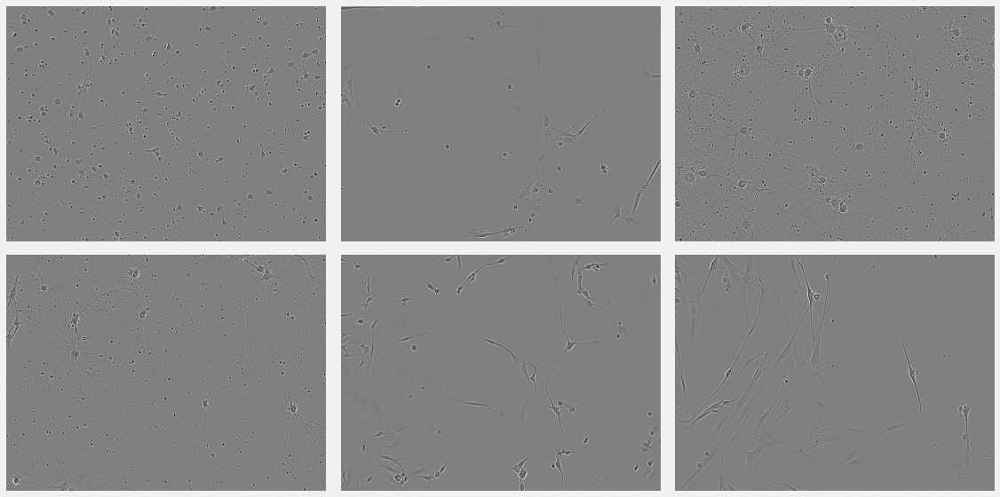

In [19]:
display_multiple_img(train_images_path[100:150], 2, 3)

### Training Semi Supervised Images

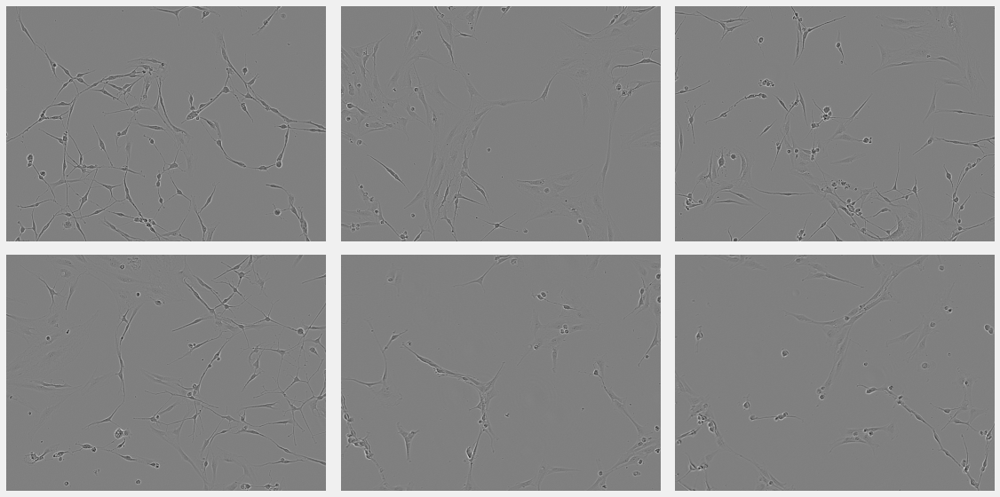

In [20]:
display_multiple_img(train_semi_supervised_path[100:150], 2, 3)

### Test Images

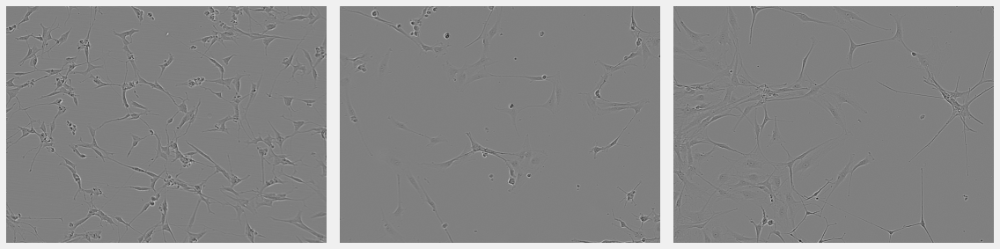

In [21]:
display_multiple_img(test_images_path, 1, 3)

## Mask plots

In [22]:
def rle_decode(mask_rle, shape, color=1):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height, width, channels) of array to return 
    color: color for the mask
    Returns numpy array (mask)

    '''
    s = mask_rle.split()
    
    starts = list(map(lambda x: int(x) - 1, s[0::2]))
    lengths = list(map(int, s[1::2]))
    ends = [x + y for x, y in zip(starts, lengths)]
    
    img = np.zeros((shape[0] * shape[1], shape[2]), dtype=np.float32)
            
    for start, end in zip(starts, ends):
        img[start : end] = color
    
    return img.reshape(shape)

def build_masks(df_train, image_id, input_shape):
    height, width = input_shape
    labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
    mask = np.zeros((height, width))
    for label in labels:
        mask += rle_decode(label, shape=(height, width))
    mask = mask.clip(0, 1)
    return mask

def plot_masks(image_id, colors=True):
    labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
    cell_type = df_train[df_train["id"] == image_id]["cell_type"].tolist()
    cmap = {"shsy5y":(0,0,255),"astro":(0,255,0),"cort":(255,0,0)}

    if colors:
        mask = np.zeros((520, 704, 3))
        for label,cell_type in zip(labels,cell_type):
            c = cmap[cell_type]
            mask += rle_decode(label, shape=(520, 704, 3), color=c)
    else:
        mask = np.zeros((520, 704, 1))
        for label in labels:
            mask += rle_decode(label, shape=(520, 704, 1))
    mask = mask.clip(0, 1)

    image = cv2.imread(f"sartorius-cell-instance-segmentation/train/{image_id}.png")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16, 32))
    plt.subplot(3, 1, 1)
    plt.imshow(image)
    plt.axis("off")
    plt.subplot(3, 1, 2)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)
    plt.axis("off")
    plt.subplot(3, 1, 3)
    plt.imshow(mask)
    plt.axis("off")
    
    plt.show();

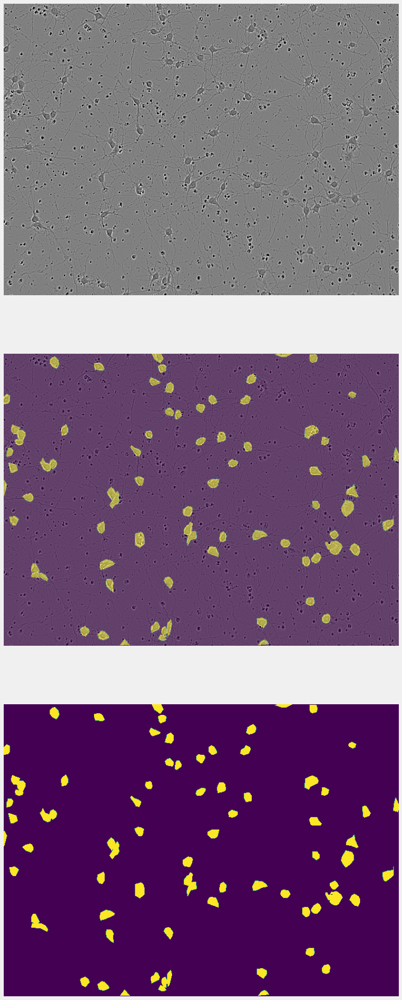

In [23]:
plot_masks("ffdb3cc02eef", colors=False)

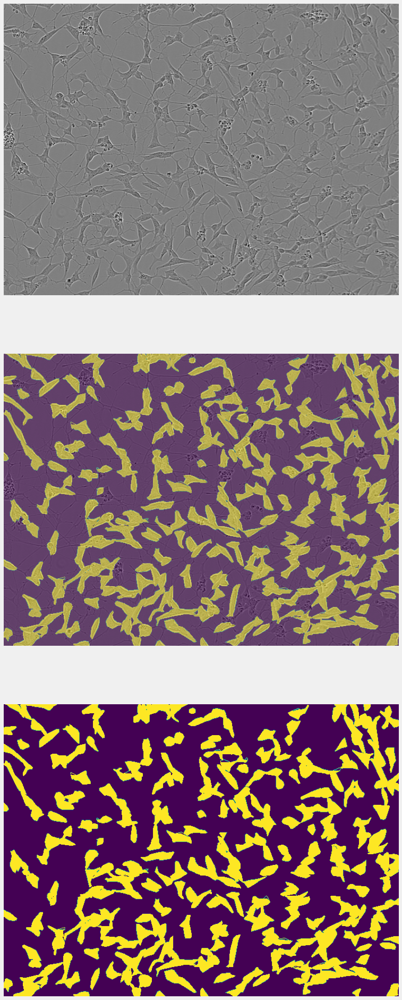

In [24]:
plot_masks("0030fd0e6378", colors=False)

In [25]:
df_train.id.unique()

array(['0030fd0e6378', '0140b3c8f445', '01ae5a43a2ab', '026b3c2c4b32',
       '029e5b3b89c7', '0323e81d23d9', '03b27b381a5f', '042c17cd9143',
       '042dc0e561a4', '04928f0866b0', '049f02e0f764', '04cd81dfb245',
       '053d61766edb', '05c61f0f46b7', '061b49d7dbbb', '06c5740c8b18',
       '0728b8f39241', '07e9ba109e34', '083b178bb184', '085eb8fec206',
       '08f52aa2add3', '097d60b2cf71', '0a6ecc5fe78a', '0ba181d412da',
       '0c5938ac5e3c', '0c90b86742b2', '0cfdeeb0dded', '0df9d6419078',
       '0e1e2b68fa58', '0e9b40b10de8', '0ea6df67cc77', '0eb1d03df587',
       '0eca9ecf4987', '0f08d640930b', '0f2a46026693', '0f7d009bc5d3',
       '100681b6cc7a', '115fad550598', '11c136be56b7', '11c2e4fcac6d',
       '1242e4ec6ef3', '129f894abe35', '13325f865bb0', '1395c3f12b7c',
       '144a7a69f67d', '14dbd973a7cd', '15283b194621', '152bcf26456b',
       '15aeb12e7a83', '16e538bbe8c5', '172334437c88', '174793807517',
       '17754cb5b287', '17d738f88487', '182c3da676bd', '1874b96fd317',
      

In [26]:
potlood = df_train.loc[df_train['id'] == '0030fd0e6378'].annotation.tolist()

In [27]:
stringetje = ''.join(potlood)

In [28]:
from PIL import Image as im

In [29]:
numpyrarray = df_train.iloc[120].annotation

In [30]:
numpyrarray = np.fromstring(stringetje, dtype=int, sep=' ')

In [31]:
numpyrarray.shape

(17814,)

In [32]:
data = im.fromarray(numpyrarray)

In [33]:
image = cv2.imread(train_images_path[0])

In [34]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [35]:
cv2.imshow('', image)

In [36]:
train_images_path[0]

'sartorius-cell-instance-segmentation/train\\0030fd0e6378.png'

In [37]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [38]:
import cv2

In [39]:
df_train

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
...,...,...,...,...,...,...,...,...,...
73580,ffdb3cc02eef,3610 3 4311 7 5014 9 5717 11 6420 13 7123 15 7...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73581,ffdb3cc02eef,341585 2 342287 5 342988 10 343690 13 344394 1...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73582,ffdb3cc02eef,47788 3 48490 7 49192 11 49896 13 50599 14 513...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73583,ffdb3cc02eef,333290 1 333993 2 334696 4 335399 5 336102 6 3...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00


In [40]:
test = df_train.loc[df_train['id'] == '0030fd0e6378'].annotation.tolist()

In [41]:
test

['118145 6 118849 7 119553 8 120257 8 120961 9 121665 10 122369 12 123074 13 123778 14 124482 15 125186 16 125890 17 126594 18 127298 19 128002 20 128706 21 129410 22 130114 23 130818 24 131523 24 132227 25 132931 25 133635 24 134339 24 135043 23 135748 21 136452 19 137157 16 137864 11 138573 4',
 '189036 1 189739 3 190441 6 191144 7 191848 8 192552 9 193256 10 193960 11 194664 11 195368 12 196072 12 196776 13 197480 13 198185 13 198889 13 199593 14 200297 13 201002 11 201706 10 202410 9 203115 7 203819 6 204523 5 205227 5 205932 3 206636 2 207340 1',
 '173567 3 174270 5 174974 5 175678 6 176382 7 177085 9 177789 9 178493 10 179197 11 179901 12 180605 12 181308 14 182012 15 182716 15 183420 16 184125 16 184831 15 185536 14 186241 14 186947 12 187651 13 188356 12 189061 12 189767 10 190472 10 191177 9 191883 7 192589 5 193295 2 194000 1',
 '196723 4 197427 6 198130 7 198834 8 199538 8 200242 9 200946 9 201650 10 202354 10 203058 10 203762 11 204466 11 205170 12 205874 12 206578 13 20728

In [42]:
def decode_rle_to_mask(rle, height, width, viz=False):
    '''
    rle : run-length as string formated (start value, count)
    height : height of the mask 
    width : width of the mask
    returns binary mask
    '''
    rle = np.array(rle.split(' ')).reshape(-1, 2)
    mask = np.zeros((height*width, 1, 3))
    if viz:
        color = np.random.rand(3)
    else:
        color = [1,1,1]
    for i in rle:
        mask[int(i[0]):int(i[0])+int(i[1]), :, :] = color

    return mask.reshape(height, width, 3)

In [43]:
DIRECTORY_PATH = "sartorius-cell-instance-segmentation"
TRAIN_CSV = DIRECTORY_PATH + "/train.csv"
TRAIN_PATH = DIRECTORY_PATH + "/train"
TEST_PATH = DIRECTORY_PATH + "/test"
TRAIN_SEMI_SUPERVISED_PATH = DIRECTORY_PATH + "/train_semi_supervised"

df_train = pd.read_csv(TRAIN_CSV)

(520, 704, 3)
This is the image we are going to use, id:- 0030fd0e6378


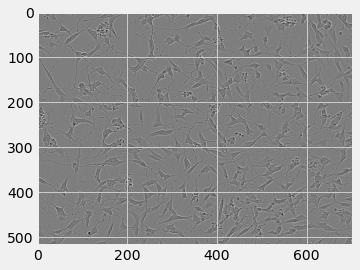

In [44]:
example_id = '0030fd0e6378' # change the example id for different images
image = cv2.imread(os.path.join(TRAIN_PATH, example_id)+'.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = (image-np.min(image))/(np.max(image)-np.min(image))
print(image.shape)
print("This is the image we are going to use, id:-", example_id)
plt.imshow(image)
plt.show()

The Annotation :  118145 6 118849 7 119553 8 120257 8 120961 9 121665 10 122369 12 123074 13 123778 14 124482 15 125186 16 125890 17 126594 18 127298 19 128002 20 128706 21 129410 22 130114 23 130818 24 131523 24 132227 25 132931 25 133635 24 134339 24 135043 23 135748 21 136452 19 137157 16 137864 11 138573 4
Now let's convert it to mask and view it


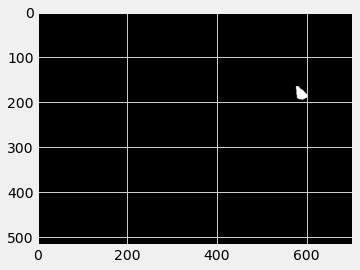

In [45]:
example_annot = df_train[df_train.id==example_id].annotation.values[0]
print("The Annotation : ",example_annot)
print("Now let's convert it to mask and view it")
mask = decode_rle_to_mask(example_annot, image.shape[0], image.shape[1], viz=False)
plt.imshow(mask)
plt.show()

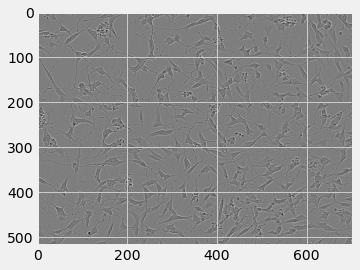

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


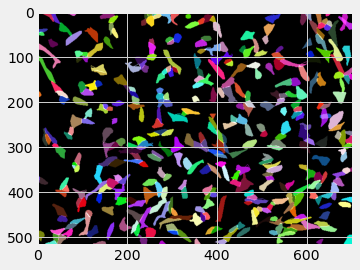

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


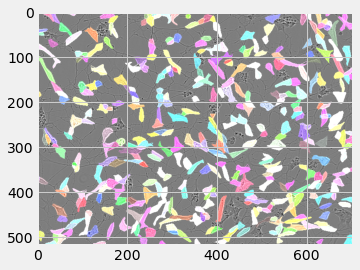

In [46]:
example_id_annotations = df_train[df_train.id==example_id].annotation.values
masks = np.zeros(image.shape)
for each_cell_annot in example_id_annotations:
    mask = decode_rle_to_mask(each_cell_annot, image.shape[0], image.shape[1], viz=True)
    masks+=mask

plt.imshow(image)
plt.show()
plt.imshow(masks)
plt.show()
t = image+masks
plt.imshow(t)
plt.show()

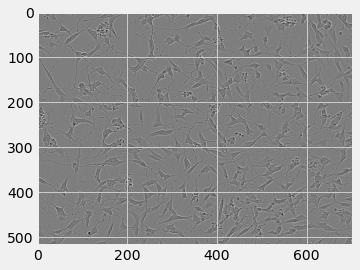

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


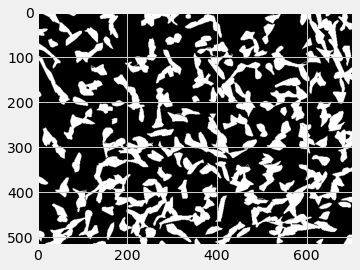

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


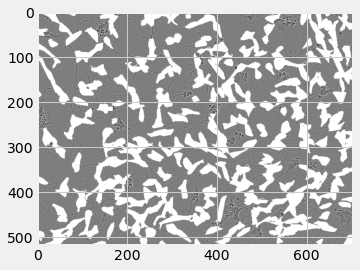

In [47]:
example_id_annotations = df_train[df_train.id==example_id].annotation.values
masks = np.zeros(image.shape)
for each_cell_annot in example_id_annotations:
    mask = decode_rle_to_mask(each_cell_annot, image.shape[0], image.shape[1], viz=False)
    masks+=mask

plt.imshow(image)
plt.show()
plt.imshow(masks)
plt.show()
t = image+masks
plt.imshow(t)
plt.show()

In [48]:
import cv2 as cv
import cv2 as cv2

In [49]:
k = 3

In [50]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 50, 0.2)

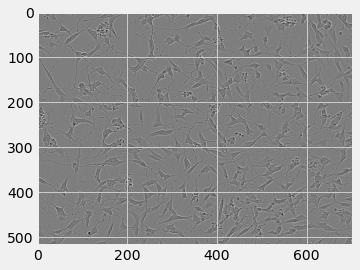

In [51]:
plt.imshow(image)
plt.show()

In [52]:
pixel_values = image.reshape((-1, 3))

In [53]:
pixel_values

array([[0.56746032, 0.56746032, 0.56746032],
       [0.59920635, 0.59920635, 0.59920635],
       [0.57142857, 0.57142857, 0.57142857],
       ...,
       [0.54761905, 0.54761905, 0.54761905],
       [0.53174603, 0.53174603, 0.53174603],
       [0.49206349, 0.49206349, 0.49206349]])

In [54]:
pixel_values = np.float32(pixel_values)

In [55]:
pixel_values

array([[0.5674603 , 0.5674603 , 0.5674603 ],
       [0.5992063 , 0.5992063 , 0.5992063 ],
       [0.5714286 , 0.5714286 , 0.5714286 ],
       ...,
       [0.54761904, 0.54761904, 0.54761904],
       [0.53174603, 0.53174603, 0.53174603],
       [0.4920635 , 0.4920635 , 0.4920635 ]], dtype=float32)

In [56]:
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

In [57]:
centers = np.uint8(centers)

In [58]:
labels = labels.flatten()

In [59]:
segmented_image = centers[labels.flatten()]

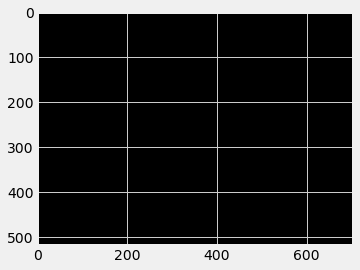

In [60]:
segmented_image = segmented_image.reshape(image.shape)
plt.imshow(segmented_image)
plt.show()

In [61]:
red = image[:,:,0]
green = image[:,:,1]
blue = image[:,:,2]

In [62]:
gray = 0.299*red + 0.587*green + 0.114*blue

In [63]:
# Hier maken we de twee kernels aan
Gx = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])
Gy = np.matrix.transpose(Gx)
print(Gx)
print(Gy)

[[ 1  2  1]
 [ 0  0  0]
 [-1 -2 -1]]
[[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]


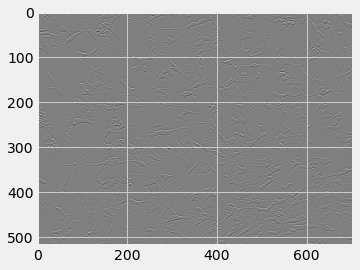

In [64]:
edgex = cv2.filter2D(gray,-1,Gx)
edgey = cv2.filter2D(gray,-1,Gy)
plt.imshow(edgex,cmap='gray')
plt.show()

In [65]:
w = np.sqrt(np.square(edgex)+np.square(edgey))

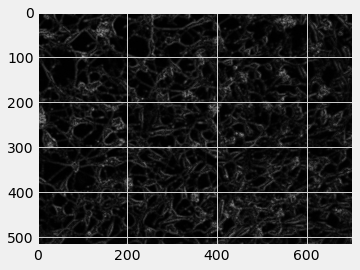

In [66]:
plt.imshow(w,cmap='gray')
plt.show()

<class 'numpy.ndarray'>
<class 'PIL.Image.Image'>
L
(704, 520)
<class 'numpy.ndarray'>


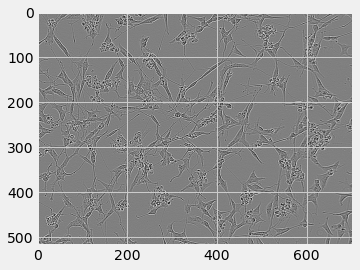

In [67]:
from PIL import Image
from PIL import ImageFilter
from matplotlib import image
from numpy import asarray

image_id = '2e8a61b4f6b5'
imageObject2 = Image.open(f"sartorius-cell-instance-segmentation/train/{image_id}.png")
imageObject = asarray(imageObject2)
print(type(imageObject))

sharpened = Image.fromarray(imageObject)
print(type(sharpened))
print(sharpened.mode)
print(sharpened.size)
# Apply sharp filter
sharpened1 = sharpened.filter(ImageFilter.SHARPEN)
sharpened2 = sharpened1.filter(ImageFilter.SHARPEN)
sharpenednumpy = asarray(sharpened2)
print(type(sharpenednumpy))
#sharpened2 = sharpened1.filter(ImageFilter.SHARPEN)

img = cv2.cvtColor(sharpenednumpy, cv2.COLOR_BGR2RGB)
plt.imshow(img)

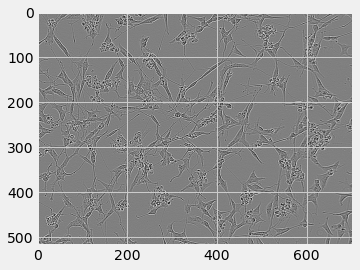

In [68]:
plt.imshow(img)

In [69]:
print (type(img))

<class 'numpy.ndarray'>


red = img[:,:,0]
green = img[:,:,1]
blue = img[:,:,2]

for i in range(len(img)):
        thisImage = Image.fromarray(img[i].astype(np.uint8))
        thisImage.show()

In [70]:
gray = 0.299*red + 0.587*green + 0.114*blue

In [71]:
# Hier maken we de twee kernels aan
Gx = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])
Gy = np.matrix.transpose(Gx)
print(Gx)
print(Gy)

[[ 1  2  1]
 [ 0  0  0]
 [-1 -2 -1]]
[[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]


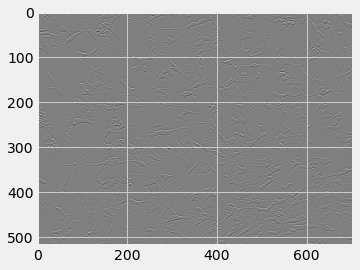

In [72]:
edgex = cv2.filter2D(gray,-1,Gx)
edgey = cv2.filter2D(gray,-1,Gy)
plt.imshow(edgex,cmap='gray')
plt.show()

In [73]:
w = np.sqrt(np.square(edgex)+np.square(edgey))

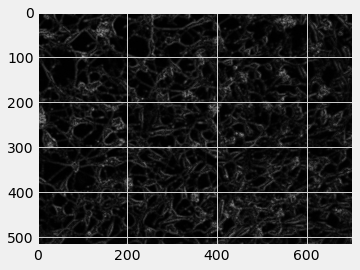

In [74]:
plt.imshow(w,cmap='gray')
plt.show()

base_image = img.copy()

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

blur1 = cv2.GaussianBlur(gray, (7,7), 0)

blur = cv2.GaussianBlur(blur1, (7,7), 0)

cv2.imwrite("img_blur.png", blur)

tresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

cv2.imwrite("img_tresh.png", tresh)

kernal = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 13))

dilate = cv2.dilate(tresh, kernal, iterations=5)

cv2.imwrite("img_dilate.png", dilate)

cnts = cv2.findContours(tresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

cnts = cnts[0] if len(cnts) == 2 else cents[1]

cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])

for c in cnts:
    x, y, w , h = cv2.boundingRect(c)
    roi = img[y:y+h, x:x+h]
    cv2.imwrite("img_boxes_roi.png", roi)
    if h > 25 and w > 25:
        cv2.rectangle(img, (x, y), (x+w, y+h), (36, 255, 12), 2)

cv2.imwrite("img_boxes.png", img)

plt.imshow(img)
plt.show()

# Code validatie

In [75]:
import tensorflow as tf

In [76]:
def decode_rle_to_mask(rle, height, width, color, viz=False):
    rle = np.array(rle.split(' ')).reshape(-1, 2)
    mask = np.zeros((height*width, 1, 3))
    if viz:
        color = np.random.rand(3)
    else:
        color = color
    for i in rle:
        mask[int(i[0]):int(i[0])+int(i[1]), :, :] = color

    return mask.reshape(height, width, 3)

In [77]:
def create_masks(source, unique_number = None):
    
    # unique_number : specifies number of unique ids to get
    # source : specifies the source variable (dataframe)
    
    masks_dict = {}

    if unique_number == None:
        unique_id = source['id'].unique()
    else:
        unique_id = source['id'].unique()[:unique_number]
        
    # Create tqdm progress bar
    bar_loop = tqdm(unique_id)
    
    # For every unique id in the data set 
    for image_id in bar_loop:
        bar_loop.set_description("Processing Mask: %s" % image_id)
        
        # Create base mask
        ground_mask = np.zeros(np.array([520, 704, 3]))

        # For each separate annotation / row
        for each_cell_annot in source[source.id==image_id].annotation.values:
            
            # Decode annotation and create mask
            mask = decode_rle_to_mask(each_cell_annot, 520, 704, 1)
            
            # Add mask to starting mask
            ground_mask+=mask
        
        # Add completed mask to dictionary
        masks_dict[image_id] = ground_mask
        
    return masks_dict

In [78]:
def getimage(image_id):
    image = cv2.imread(os.path.join(TRAIN_PATH, image_id)+'.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [79]:
def create_new_mask(row_indexes,col_indexes):
    
    predict_mask = []
    index = 0
    
    # Create mask from row index
    for pixel in row_indexes:
        predict_mask.append(pixel)
        predict_mask.append(col_indexes[index])
        index+=1
    
    # Create empty numpy array
    image_array = np.zeros((520, 704, 3), dtype=float)
    
    # Add mask to array
    for i in range(0, len(predict_mask), 2):
        row, col = predict_mask[i], predict_mask[i+1]
        image_array[row][col] = [1., 1., 1.]
    
    return image_array

In [80]:
def calculate_iou(ground_truth, prediction):
    
    # Calculate intersection
    intersection = np.logical_and(prediction, ground_truth).sum()
    
    # Calculate union
    union = np.logical_or(prediction, ground_truth).sum()
    
    # Calculate IoU
    iou = intersection / union
    
    return iou

In [81]:
def canny_edge(image):
    edges = cv2.Canny(image,100,200)
    return edges

In [82]:
def image_altering(data, alter_function):
    
    key_image = {}
    altered_images = {}
    
    # Get images from key (dict or list)
    if type(data) == dict:
        for k in data.keys():
            key_image[k] = getimage(k)
    elif type(data) == list:
        for k in data:
            key_image[k] = getimage(k)
    else:
        print('Data needs to be Dict or List')
    
    # Create tqdm progress bar
    bar_loop_data = tqdm(key_image)
    
    for k in bar_loop_data:
        bar_loop_data.set_description("Converting Image: %s" % k)
    
        # image processing techinique used to alter image (must be function)
        altered_images[k] = alter_function(key_image[k])
        
    return altered_images

In [83]:
def create_alter_mask(altered_images):
    
    # Define indexes
    row_indexes, col_indexes = np.nonzero(altered_images)
    
    # Create prediction mask
    predict_mask = create_new_mask(row_indexes,col_indexes)
    
    return predict_mask

In [84]:
def compare_masks(masks_dict, altered_images): 
    # Create tqdm progress bar
    bar_loop_keys = tqdm(altered_images)
    score_dict = {}

    # For every key in dict 
    for key in bar_loop_keys:
        bar_loop_keys.set_description("Calculating Score:\t %s" % key)

        # Create prediction mask
        predict_mask = np.array(create_alter_mask(altered_images[key]))

        # Calculate IoU
        score = calculate_iou(masks_dict[key], predict_mask)

        score_dict[key] = score
        
    return score_dict

In [85]:
train_folder = r"C:\Users\thoma\OneDrive\Bureaublad\IPDAMH\Image_Processing\sartorius-cell-instance-segmentation\train"

In [86]:
import tensorflow as tf

def K_means(image):
    i = 0
    nummer = 1
    scores = []
    for foto in os.listdir(train_folder):
        if i <= 0:
            getimage(image_id)
            pixel_values = img.reshape((-1, 3))
            pixel_values = np.float32(pixel_values)
            criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 50, 0.2)
            k = 5
            _, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
            centers = np.uint8(centers)
            labels = labels.flatten()
            segmented_image = centers[labels.flatten()]
            segmented_image = segmented_image.reshape(img.shape)
            masked_image = np.copy(img)
            masked_image = masked_image.reshape((-1, 3))
            cluster = 2
            masked_image[labels == cluster] = [0, 0, 0]
            masked_image = masked_image.reshape(img.shape)
            plt.imshow(masked_image, cmap='gray')
            edges = cv2.Canny(masked_image, 100, 200)
            row_indexes, col_indexes = np.nonzero(edges)
            plt.imshow(edges, cmap='gray')
            image 
            # dit weghalen als alle foto's gedaan moeten worden
            voorspel_mask = create_new_mask(row_indexes,col_indexes)
            i = i + 1
            nummer = nummer + 1
            print(f"{edges} dit zijn de edges")
    return edges

In [87]:
image_id1 = "042dc0e561a4"
image_id2 = "0030fd0e6378"
image_id3 = "2e8a61b4f6b5"

In [88]:
from sklearn.neighbors import KNeighborsClassifier
from PIL import Image
import numpy as np
from sklearn.cluster import KMeans

image_array1 = getimage(image_id1)
image_array2 = getimage(image_id2)
image_array3 = getimage(image_id3)
image=[image_array1, image_array2, image_array3]

reshaped=[0,0,0]

for i in range(0,3):
    reshaped[i] = image[i].reshape(image[i].shape[0] * image[i].shape[1], image[i].shape[2])

In [89]:
clustering=[0,0,0]
numClusters = [2,2,2]

for i in range(0,3):
    kmeans = KMeans(n_clusters=numClusters[i], n_init=40, max_iter=500).fit(reshaped[i])
    clustering[i] = np.reshape(np.array(kmeans.labels_, dtype=np.uint8),
    (image[i].shape[0], image[i].shape[1]))

In [90]:
sortedLabels=[[],[],[]]
for i in range(0,3):
    sortedLabels[i] = sorted([n for n in range(numClusters[i])],
        key=lambda x: -np.sum(clustering[i] == x))

In [91]:
kmeansImage=[0,0,0]
concatImage=[[],[],[]]
for j in range(0,3):
    kmeansImage[j] = np.zeros(image[j].shape[:2], dtype=np.uint8)
    for i, label in enumerate(sortedLabels[j]):
        kmeansImage[j][ clustering[j] == label ] = int((255) / (numClusters[j] - 1)) * i
    concatImage[j] = np.concatenate((image[j],700 * np.ones((image[j].shape[0], int(0.02 * image[j].shape[1]), 3), dtype=np.uint8),cv2.cvtColor(kmeansImage[j], cv2.COLOR_GRAY2BGR)), axis=1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


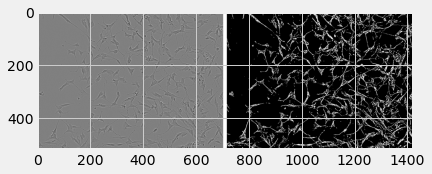

In [92]:
plt.imshow(concatImage[0], cmap='gray')

plt.show()

from PIL import Image
import numpy as np
from sklearn.cluster import KMeans


def KNN(image):

    for foto in os.listdir(train_folder):
        
        image_array = getimage(image_id)
        # Flatten image to 1D array
        X = image_array.reshape(-1, 3)

        # Create labels for data
        y = np.array([0 if pixel.mean() < 128 else 1 for pixel in X])

        # Create k-NN classifier
        knn = KNeighborsClassifier(n_neighbors=3)

        # Fit the classifier to the data
        knn.fit(X, y)

        # Create mask using k-NN classifier
        mask = knn.predict(X).reshape(image_array.shape[:-1])
    
   
    return mask

def get_img(path):
    imagenames = []
    for dirname, , filenames in os.walk(path):
        for filename in tqdm(filenames):
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
        return image_names

In [93]:
def getimage(image_id):
    image = cv2.imread(os.path.join(TRAIN_PATH, image_id)+'.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [94]:
from sklearn.model_selection import train_test_split
import os

# lijst van paden naar afbeeldingen
image_paths = [os.path.join(train_folder, f) for f in os.listdir(train_folder) if f.endswith('.png')]

# splits de afbeeldingspaden in train en test sets
train_paths, test_paths = train_test_split(image_paths, test_size=0.2)

In [105]:
train_paths

['C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartorius-cell-instance-segmentation\\train\\0a6ecc5fe78a.png',
 'C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartorius-cell-instance-segmentation\\train\\083b178bb184.png',
 'C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartorius-cell-instance-segmentation\\train\\7b27ca965a93.png',
 'C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartorius-cell-instance-segmentation\\train\\9e8da786a80f.png',
 'C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartorius-cell-instance-segmentation\\train\\c4dc7ddff8ec.png',
 'C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartorius-cell-instance-segmentation\\train\\8e2b69117149.png',
 'C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartorius-cell-instance-segmentation\\train\\8ae77a7c490c.png',
 'C:\\Users\\thoma\\OneDrive\\Bureaublad\\IPDAMH\\Image_Processing\\sartoriu

In [96]:
_, filename = os.path.split(train_paths[0])

In [97]:
def get_filename(filename):
    j = 0 
    for i in train_paths:
        if j <= len(train_paths):
            _, filename = os.path.split(train_paths[j])
            tempTuple = os.path.splitext(filename)
            filename = tempTuple[0]
            filename = getimage(filename)
            j=j+1
    return filename
        

In [99]:
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split
def train_knn():
    for i in train_paths:
        image_array = get_filename()
        knn = KNeighborsClassifier(n_neighbors=3)
        X = image_array.reshape(-1, 3)
        y = np.array([1 if pixel.mean() < 128 else 0 for pixel in X])
        knn.fit(X, y)
        mask = knn.predict(X).reshape(image_array.shape[:-1])
        plt.imshow(mask, cmap='gray')
        plt.show()

In [100]:
train_knn()

TypeError: get_filename() missing 1 required positional argument: 'filename'

In [101]:
mask = knn.predict(X).reshape(image_array.shape[:-1])

NameError: name 'knn' is not defined

In [103]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split

def KNN(image):       
             
    print(X)
    # Create k-NN classifier
    knn = KNeighborsClassifier(n_neighbors=3)
    
    # Fit the classifier to the training data
    knn.fit(train_paths, test_paths)

    # Create mask using k-NN classifier
    mask = knn.predict(X).reshape(image_array.shape[:-1])
    
    return mask


In [104]:
# variables: df source and optional number of unique ids (default = all)
masks_dict = create_masks(df_train, 3)

# Alter images with image processing techniques (variable dict or list with Ids and image altering function)
altered_images = image_altering(masks_dict, KNN)

# Compare original mask and created mask
dikkedict = compare_masks(masks_dict, altered_images)

for k, v in dikkedict.items():
    print(f"{k} : {v}")

print(f"\nAverage Score: {sum(dikkedict.values()) / len(dikkedict)}")

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

NameError: name 'X' is not defined

import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split


image_id = "042dc0e561a4"
image_array = getimage(image_id)

# Flatten image to 1D array
X = image_array.reshape(-1, 1)

# Create labels for training data
y = np.array([0 if pixel.mean() < 28 else 1 for pixel in X])

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create k-NN classifier
knn = KNeighborsClassifier(n_neighbors=3)

# Fit the classifier to the training data
knn.fit(X_train, y_train)

# Test the classifier on the test data
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


# Create mask using k-NN classifier
mask = knn.predict(X).reshape(image_array.shape[:-1])

plt.imshow(mask, cmap='gray')
plt.show()

In [ ]:
pic = getimage(image_id)

In [ ]:
pic_n = pic.reshape(pic.shape[0]*pic.shape[1], pic.shape[2])
pic_n.shape

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(pic_n)
pic2show = kmeans.cluster_centers_[kmeans.labels_]

In [ ]:
cluster_pic = pic2show.reshape(pic.shape[0], pic.shape[1], pic.shape[2])
plt.imshow(cluster_pic)

In [ ]:
!pip install simplepreprocessor

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import clear_border
from skimage import measure
from skimage.measure import label,regionprops
from scipy import ndimage as ndi
from scipy.ndimage import measurements, center_of_mass, binary_dilation, zoom
import plotly.graph_objects as go

In [ ]:
def decode_rle_to_mask(rle, height, width, color, viz=False):
    rle = np.array(rle.split(' ')).reshape(-1, 2)
    mask = np.zeros((height*width, 1, 3))
    if viz:
        color = color
    else:
        color = color
    for i in rle:
        mask[int(i[0]):int(i[0])+int(i[1]), :, :] = color

    return mask.reshape(height, width, 3)

In [ ]:
def create_masks():

    masks_dict = {}
    name_number = 1

    # For every unique id in the training data set 
    for image_id in df_train['id'].unique():
        
        # Create base mask
        ground_mask = np.zeros(np.array([520, 704, 3]))

        # For each seperate annotation / row
        for each_cell_annot in df_train[df_train.id==image_id].annotation.values:
            
            # Decode annotation and create mask
            mask = decode_rle_to_mask(each_cell_annot, 520, 704, 1)
            
            # Add mask to starting mask
            ground_mask+=mask
            
        print(f"Added to dictionary: {f'masks{name_number}'} created with id: {image_id}")
        
        # Add completed mask to dictionary
        masks_dict[f"masks{name_number}"] = ground_mask
        
        name_number+=1
        
    return masks_dict

In [ ]:
masks_dict = create_masks()

In [ ]:
image_id = '0a6ecc5fe78a'

In [ ]:
img = Image.open(f"sartorius-cell-instance-segmentation/train/{image_id}.png")
imageObject = asarray(img)
img = cv2.cvtColor(imageObject, cv2.COLOR_BGR2RGB)

In [ ]:
pixel_values = img.reshape((-1, 3))

In [ ]:
pixel_values = np.float32(pixel_values)

In [ ]:
print(pixel_values.shape)

In [ ]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 50, 0.2)

In [ ]:
k = 5
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

In [ ]:
centers = np.uint8(centers)
labels = labels.flatten()

In [ ]:
segmented_image = centers[labels.flatten()]

In [ ]:
segmented_image = segmented_image.reshape(img.shape)
plt.imshow(segmented_image)
plt.show()

In [ ]:
masked_image = np.copy(img)
masked_image = masked_image.reshape((-1, 3))
cluster = 2
masked_image[labels == cluster] = [0, 0, 0]
masked_image = masked_image.reshape(img.shape)
plt.imshow(masked_image, cmap='gray')
plt.show()

In [ ]:
Gx = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])
Gy = np.matrix.transpose(Gx)

In [ ]:
edgex = cv2.filter2D(masked_image,-1,Gx)
edgey = cv2.filter2D(masked_image,-1,Gy)
plt.imshow(edgex,cmap='gray')
plt.show()

In [ ]:
edges = cv2.Canny(edgex, 100, 200)

row_indexes, col_indexes = np.nonzero(edges)

In [ ]:
def mask_maken(row_indexes,col_indexes):
    #inlezen 1 waardes voor de mask
    array = []
    tel = 0
    predict_mask = []
    for i in row_indexes:
        predict_mask.append(i)
        predict_mask.append(col_indexes[tel])
        tel = tel + 1
    # aanmaken array met juiste aantal rijen
    image_array= []
    a = []
    groote = 519
    i = 0
    while i <= 519:
        a = []
        image_array.append(a)
        i = i +1
    # aanmaken array met juiste aantal kolomen
    i = 0
    while i <= 519:
        o = 0
        while o <= 703:
            a = []
            image_array[i].append(a)
            o = o+1
        i = i +1
    # vullen array
    for i in image_array:
        for r in i:
                r.append(0.)
                r.append(0.)
                r.append(0.)
    # toevoegen mask aan array
    getal = 519
    i= 0
    lengte = len(predict_mask)
    lengte = lengte - 1
    while i <= lengte:
        rij = predict_mask[i]
        kolom = predict_mask[i+1]
        image_array[rij][kolom].clear()
        image_array[rij][kolom].append(1.)
        image_array[rij][kolom].append(1.)
        image_array[rij][kolom].append(1.)
        i = i + 2
    return image_array

In [ ]:
def score_berekenen(masks, image_array):
    getal = 519
    getal2 = 703
    i=0
    j=0
    resultaten = []
    #
    while i <= getal:
        while j <= getal2:
            m = tf.keras.metrics.MeanIoU(num_classes=2)
            if masks[i][j][0] == 2.0:
                masks[i][j] = [1., 1., 1.]
            m.update_state(masks[i][j], image_array[i][j])
            resultaten.append(m.result().numpy())
            j = j +1
        i = i + 1
    return resultaten

In [ ]:
print(f"Average score: {sum(scores) / len(scores)}")